# Fixing the seeds 

In [ ]:
import torch
import random
import numpy as np

def set_seed(seed_value):
    torch.manual_seed(seed_value)
    torch.cuda.manual_seed(seed_value)
    torch.cuda.manual_seed_all(seed_value)  # if you are using multi-GPU.
    np.random.seed(seed_value)  # Numpy module.
    random.seed(seed_value)  # Python random module.
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True



set_seed(42)

In [ ]:
import torch
device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

# Dataset

In [ ]:
# from Experiment1.models import *
import os

os.chdir('../')
cwd = os.getcwd()
print(cwd)

/home/mohammad/mohamed-thesis


In [ ]:
from CUB.dataset import load_data
# def load_data(pkl_paths, use_attr, no_img, batch_size, uncertain_label=False, n_class_attr=2, image_dir='images', resampling=False, resol=299):
n_concepts = 112
batch_size = 16
test_loader = load_data(['CUB_processed/class_attr_data_10/test.pkl'], True, False, 32)
train_loader = load_data(['CUB_processed/class_attr_data_10/train.pkl'], True, False, 32)

# Models

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class Sequential(nn.Module):
    def __init__(self, model1_path, model2_path):
        super(Sequential, self).__init__()
        self.model1 = torch.load(model1_path)
        self.model2 = torch.load(model2_path)

    def forward(self, x):
        # try:
        #     x = self.model1(x)
        #     x = torch.stack(x).squeeze().t()
        #     x = self.model2(x)
        # except:
        #     x = torch.stack(x[0]).squeeze().t()
        #     x = self.model2(x)
        # print(x.shape)
        x = self.model1(x)
        # print(x.shape)
        x = torch.stack(x).squeeze().t()
        # print(x)
        x = self.model2(x)
        # print(x.shape)
        if len(x.shape) == 1:
            x = x.unsqueeze(0)
        return x



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class Joint(nn.Module):
    def __init__(self, model_path):
        super(Joint, self).__init__()
        self.model = torch.load(model_path)

    def forward(self, x):
        x = self.model(x)[0]
        if isinstance(x, list):
            x = x[0]
        return x

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class Standard(nn.Module):
    def __init__(self, model_path):
        super(Standard, self).__init__()
        self.model = torch.load(model_path)

    def forward(self, x):
        x = self.model(x)[0]
        if isinstance(x, list):
            x = x[0]
        return x

# Loading the models

In [ ]:
model_1_path = r'ConceptModel__Seed1 old/output/best_model_1.pth'
model_2_path = r'SequentialModel_WithVal__Seed1/best_model_42.pth'
sequential = Sequential(model_1_path, model_2_path).to(device)
sequential.eval()
print('done')

done


In [ ]:
import torch

joint_model_path = 'Joint0.01Model__Seed1/outputs/best_model_1.pth'
joint_model = Joint(joint_model_path).to(device)
joint_model.eval()
print(1)

1


In [ ]:
import torch

standard_model = Standard("Standard0Model_Seed1/outputs/best_model_1.pth").to(device)
standard_model.eval()
print(1)

1


# Testing the preformance of the models under attack with each class

In [11]:
import logging
import foolbox as fb
from collections import defaultdict
from tqdm import tqdm

# Set up logging
logging.basicConfig(filename='logs.txt', level=logging.INFO, 
                    format='%(asctime)s:%(levelname)s:%(message)s')

def deepfool_attack(model, test_loader, eps, model_name):
    bounds = (-0.25, 0.25)
    fmodel = fb.PyTorchModel(model, bounds=bounds)
    attack = fb.attacks.LinfDeepFoolAttack()

    # Track the number of correct predictions overall and per class
    correct_per_class = defaultdict(int)
    total_per_class = defaultdict(int)
    counter = 0
    for images, labels, _ in tqdm(test_loader, desc=f"Attacking Images with {model_name}"):
        images, labels = images.to(device), labels.to(device)
        raw_advs, clipped_advs, success = attack(fmodel, images, labels, epsilons=eps)
        logits = model(clipped_advs)
        preds = torch.argmax(logits, dim=1)

        # Update per class correct predictions
        for label, pred in zip(labels, preds):
            total_per_class[label.item()] += 1
            if label == pred:
                correct_per_class[label.item()] += 1

        # counter += 1
        # if counter == 10:
        #     break

    # Calculate per-class accuracy
    per_class_accuracy = {cls: correct_per_class[cls] / total_per_class[cls] for cls in total_per_class}

    # Log the per-class accuracy
    logging.info(f"Model: {model_name}, Eps: {eps}, Per-class accuracy: {per_class_accuracy}")

    # Calculate and log the final accuracy for the adversarial images
    final_accuracy = sum(correct_per_class.values()) / sum(total_per_class.values())
    logging.info(f"Model: {model_name}, Eps: {eps}, Accuracy on adversarial examples: {final_accuracy*100:.2f}%")
    return final_accuracy, per_class_accuracy

models = ['Sequential', 'joint_model', 'standard_model']
models_classes = {'Sequential': Sequential, 'joint_model': Joint, 'standard_model': Standard}
save_models_path = r"src/Adversarially trained models"
csv_file_path = r"src/Adversarially trained models/experiments.csv"
attack_config = {
    'eps_step': 0.01,
    'max_iter': 10,
    'clip_values': (-0.25, 0.25),
    'input_shape': (3, 299, 299),
    'nb_classes': 200
}
# # Example usage:
# attack_mapping = {
#     'CWL2': CarliniL2Method,
#     'CWLinf': CarliniLInfMethod,
#     'DeepFool': DeepFool
# }

eps_values = [0.001]
experiments = []
# Loading the models
for model_name in models:
  for eps in eps_values:
    experiment = {
        'model_name': model_name,
        'Trained on eps': eps
    }
    if model_name == 'Sequential':
        model_1_path = r'ConceptModel__Seed1 old/output/best_model_1.pth'
        model_2_path = r'SequentialModel_WithVal__Seed1/best_model_42.pth'
        model = Sequential(model_1_path, model_2_path).to(device)
        model.eval()
    elif model_name == 'joint_model':
        joint_model_path = 'Joint0.01Model__Seed1/outputs/best_model_1.pth'
        model = Joint(joint_model_path).to(device)
        model.eval()
    elif model_name == 'standard_model':
        model = Standard("Standard0Model_Seed1/outputs/best_model_1.pth").to(device)
        model.eval()
        
    model_path = f"{save_models_path}/{model_name}_{str(eps).split('.')[1]}.pth"
    model.load_state_dict(torch.load(model_path))
    print(f"Loaded {model_name}_{str(eps).split('.')[1]}")
    # selected_attack = attack_mapping['CWL2']
    model.eval()
    # accuracy = attack_deepfool(model, test_loader,test_labels, attack_config)
    accuracy, per_class_accuracy = deepfool_attack(model, test_loader, eps, model_name)
    print(accuracy)



Loaded Sequential_001


Attacking Images with Sequential: 100%|██████████| 182/182 [22:54<00:00,  7.55s/it]


0.3709009319986193
Loaded joint_model_001


Attacking Images with joint_model: 100%|██████████| 182/182 [21:23<00:00,  7.05s/it]


0.3225750776665516
Loaded standard_model_001


Attacking Images with standard_model: 100%|██████████| 182/182 [22:19<00:00,  7.36s/it]

0.4345875043148084


In [ ]:
# Loaded from the logs
sequential_pref = {0: 0.5, 1: 0.06666666666666667, 2: 0.14285714285714285, 3: 0.3333333333333333, 4: 0.5714285714285714, 5: 0.7272727272727273, 6: 0.391304347826087, 7: 0.3888888888888889, 8: 0.3793103448275862, 9: 0.3, 10: 0.23333333333333334, 11: 0.8846153846153846, 12: 0.7666666666666667, 13: 0.9333333333333333, 14: 0.10714285714285714, 15: 0.6071428571428571, 16: 0.4074074074074074, 17: 0.8, 18: 0.5172413793103449, 19: 0.06896551724137931, 20: 0.5, 21: 0.8846153846153846, 22: 0.10344827586206896, 23: 0.09090909090909091, 24: 0.1, 25: 0.26666666666666666, 26: 0.0, 27: 0.5517241379310345, 28: 0.0, 29: 0.3, 30: 0.6, 31: 0.17391304347826086, 32: 0.0, 33: 0.13793103448275862, 34: 0.36666666666666664, 35: 0.8, 36: 0.13793103448275862, 37: 0.26666666666666666, 38: 0.034482758620689655, 39: 0.0, 40: 0.4, 41: 0.43333333333333335, 42: 0.27586206896551724, 43: 0.16666666666666666, 44: 0.26666666666666666, 45: 0.6333333333333333, 46: 0.6, 47: 0.6, 48: 0.2, 49: 0.0, 50: 0.9, 51: 0.16666666666666666, 52: 0.3333333333333333, 53: 0.03333333333333333, 54: 0.7666666666666667, 55: 0.6666666666666666, 56: 0.3333333333333333, 57: 0.42857142857142855, 58: 0.1, 59: 0.0, 60: 0.5666666666666667, 61: 0.0, 62: 0.4, 63: 0.0, 64: 0.0, 65: 0.4666666666666667, 66: 0.3, 67: 0.03333333333333333, 68: 0.06666666666666667, 69: 0.6666666666666666, 70: 0.2, 71: 0.13333333333333333, 72: 0.8, 73: 0.2, 74: 0.7777777777777778, 75: 0.6333333333333333, 76: 0.4666666666666667, 77: 0.0, 78: 0.5333333333333333, 79: 0.4, 80: 0.8, 81: 0.1, 82: 0.6666666666666666, 83: 0.17391304347826086, 84: 0.6666666666666666, 85: 0.3333333333333333, 86: 0.4666666666666667, 87: 0.5, 88: 0.8, 89: 0.26666666666666666, 90: 0.1, 91: 0.26666666666666666, 92: 0.9333333333333333, 93: 0.5, 94: 0.43333333333333335, 95: 0.3333333333333333, 96: 0.5172413793103449, 97: 0.8, 98: 0.5333333333333333, 99: 0.43333333333333335, 100: 0.35, 101: 0.26666666666666666, 102: 0.3, 103: 0.0, 104: 0.0, 105: 0.6, 106: 0.13333333333333333, 107: 0.13333333333333333, 108: 0.8333333333333334, 109: 0.6666666666666666, 110: 0.7333333333333333, 111: 0.1, 112: 0.0, 113: 0.8, 114: 0.2413793103448276, 115: 0.2, 116: 0.0, 117: 0.16666666666666666, 118: 0.0, 119: 0.4, 120: 0.3, 121: 0.4, 122: 0.3333333333333333, 123: 0.3448275862068966, 124: 0.4827586206896552, 125: 0.3, 126: 0.4, 127: 0.3, 128: 0.06666666666666667, 129: 0.3333333333333333, 130: 0.03333333333333333, 131: 0.23333333333333334, 132: 0.7666666666666667, 133: 0.5, 134: 0.1, 135: 0.43333333333333335, 136: 0.36666666666666664, 137: 0.5, 138: 0.7666666666666667, 139: 0.9, 140: 0.06896551724137931, 141: 0.03333333333333333, 142: 0.0, 143: 0.23333333333333334, 144: 0.1, 145: 0.0, 146: 0.26666666666666666, 147: 0.7, 148: 0.6896551724137931, 149: 0.4, 150: 0.5714285714285714, 151: 0.06666666666666667, 152: 0.0, 153: 0.13333333333333333, 154: 0.06666666666666667, 155: 0.6333333333333333, 156: 0.3793103448275862, 157: 0.4, 158: 0.7333333333333333, 159: 0.8620689655172413, 160: 0.1, 161: 0.5666666666666667, 162: 0.4666666666666667, 163: 0.4666666666666667, 164: 0.5666666666666667, 165: 0.7241379310344828, 166: 0.6666666666666666, 167: 0.20689655172413793, 168: 0.7586206896551724, 169: 0.5, 170: 0.5666666666666667, 171: 0.26666666666666666, 172: 0.16666666666666666, 173: 0.26666666666666666, 174: 0.36666666666666664, 175: 0.5, 176: 0.1, 177: 0.0, 178: 0.1724137931034483, 179: 0.7333333333333333, 180: 0.3103448275862069, 181: 0.36666666666666664, 182: 0.43333333333333335, 183: 0.0, 184: 0.5333333333333333, 185: 0.5333333333333333, 186: 0.35, 187: 0.6333333333333333, 188: 0.36666666666666664, 189: 0.7931034482758621, 190: 0.26666666666666666, 191: 0.6333333333333333, 192: 0.2, 193: 0.4, 194: 0.4666666666666667, 195: 0.1, 196: 0.3, 197: 0.43333333333333335, 198: 0.13333333333333333, 199: 0.7333333333333333}
joint_pref = {0: 0.03333333333333333, 1: 0.03333333333333333, 2: 0.10714285714285714, 3: 0.16666666666666666, 4: 0.35714285714285715, 5: 0.5454545454545454, 6: 0.21739130434782608, 7: 0.2222222222222222, 8: 0.2413793103448276, 9: 0.7333333333333333, 10: 0.26666666666666666, 11: 0.6538461538461539, 12: 0.6666666666666666, 13: 0.3333333333333333, 14: 0.7857142857142857, 15: 0.5, 16: 0.7777777777777778, 17: 0.13333333333333333, 18: 0.3793103448275862, 19: 0.6206896551724138, 20: 0.43333333333333335, 21: 0.0, 22: 0.3448275862068966, 23: 0.5, 24: 0.0, 25: 0.36666666666666664, 26: 0.1, 27: 0.3448275862068966, 28: 0.03333333333333333, 29: 0.03333333333333333, 30: 0.0, 31: 0.08695652173913043, 32: 0.13793103448275862, 33: 0.41379310344827586, 34: 0.43333333333333335, 35: 0.8, 36: 0.034482758620689655, 37: 0.06666666666666667, 38: 0.0, 39: 0.06666666666666667, 40: 0.5666666666666667, 41: 0.5, 42: 0.10344827586206896, 43: 0.5, 44: 0.03333333333333333, 45: 0.6333333333333333, 46: 0.5333333333333333, 47: 0.5333333333333333, 48: 0.03333333333333333, 49: 0.13333333333333333, 50: 0.6333333333333333, 51: 0.26666666666666666, 52: 0.5, 53: 0.06666666666666667, 54: 0.7666666666666667, 55: 0.5666666666666667, 56: 0.7333333333333333, 57: 0.14285714285714285, 58: 0.03333333333333333, 59: 0.0, 60: 0.5, 61: 0.2, 62: 0.6666666666666666, 63: 0.36666666666666664, 64: 0.05, 65: 0.0, 66: 0.0, 67: 0.43333333333333335, 68: 0.03333333333333333, 69: 0.7666666666666667, 70: 0.23333333333333334, 71: 0.36666666666666664, 72: 0.5, 73: 0.3333333333333333, 74: 0.5555555555555556, 75: 0.36666666666666664, 76: 0.3, 77: 0.5172413793103449, 78: 0.13333333333333333, 79: 0.26666666666666666, 80: 0.7333333333333333, 81: 0.1, 82: 0.4666666666666667, 83: 0.21739130434782608, 84: 0.43333333333333335, 85: 0.4, 86: 0.5, 87: 0.8666666666666667, 88: 0.7666666666666667, 89: 0.4666666666666667, 90: 0.06666666666666667, 91: 0.43333333333333335, 92: 0.7, 93: 0.6333333333333333, 94: 0.26666666666666666, 95: 0.36666666666666664, 96: 0.4482758620689655, 97: 0.7333333333333333, 98: 0.26666666666666666, 99: 0.3333333333333333, 100: 0.75, 101: 0.0, 102: 0.5666666666666667, 103: 0.23333333333333334, 104: 0.8421052631578947, 105: 0.5, 106: 0.1, 107: 0.26666666666666666, 108: 0.1, 109: 0.6, 110: 0.5333333333333333, 111: 0.13333333333333333, 112: 0.05, 113: 0.3, 114: 0.0, 115: 0.5, 116: 0.0, 117: 0.2, 118: 0.10344827586206896, 119: 0.4, 120: 0.2, 121: 0.16666666666666666, 122: 0.1, 123: 0.0, 124: 0.0, 125: 0.03333333333333333, 126: 0.0, 127: 0.6, 128: 0.03333333333333333, 129: 0.0, 130: 0.1, 131: 0.6666666666666666, 132: 0.2, 133: 0.26666666666666666, 134: 0.1, 135: 0.5333333333333333, 136: 0.03333333333333333, 137: 0.26666666666666666, 138: 0.7333333333333333, 139: 0.6666666666666666, 140: 0.3103448275862069, 141: 0.03333333333333333, 142: 0.0, 143: 0.0, 144: 0.2, 145: 0.1, 146: 0.5666666666666667, 147: 0.23333333333333334, 148: 0.06896551724137931, 149: 0.4, 150: 0.7619047619047619, 151: 0.6, 152: 0.0, 153: 0.06666666666666667, 154: 0.06666666666666667, 155: 0.06666666666666667, 156: 0.2413793103448276, 157: 0.16666666666666666, 158: 0.6, 159: 0.13793103448275862, 160: 0.13333333333333333, 161: 0.7666666666666667, 162: 0.03333333333333333, 163: 0.7, 164: 0.5, 165: 0.7241379310344828, 166: 0.6666666666666666, 167: 0.1724137931034483, 168: 0.6206896551724138, 169: 0.2, 170: 0.36666666666666664, 171: 0.2, 172: 0.03333333333333333, 173: 0.0, 174: 0.36666666666666664, 175: 0.7333333333333333, 176: 0.13333333333333333, 177: 0.23076923076923078, 178: 0.034482758620689655, 179: 0.13333333333333333, 180: 0.13793103448275862, 181: 0.43333333333333335, 182: 0.3333333333333333, 183: 0.6333333333333333, 184: 0.6666666666666666, 185: 0.03333333333333333, 186: 0.25, 187: 0.7, 188: 0.7, 189: 0.6206896551724138, 190: 0.6333333333333333, 191: 0.9666666666666667, 192: 0.16666666666666666, 193: 0.1, 194: 0.23333333333333334, 195: 0.0, 196: 0.03333333333333333, 197: 0.03333333333333333, 198: 0.3333333333333333, 199: 0.43333333333333335}
standard_pref = {0: 0.2, 1: 0.16666666666666666, 2: 0.6785714285714286, 3: 0.3333333333333333, 4: 0.35714285714285715, 5: 0.5454545454545454, 6: 0.782608695652174, 7: 0.2777777777777778, 8: 0.3448275862068966, 9: 0.6, 10: 0.26666666666666666, 11: 0.7692307692307693, 12: 0.6333333333333333, 13: 0.7666666666666667, 14: 0.6785714285714286, 15: 0.7142857142857143, 16: 0.8148148148148148, 17: 1.0, 18: 0.3103448275862069, 19: 0.7241379310344828, 20: 0.43333333333333335, 21: 0.0, 22: 0.2413793103448276, 23: 0.7272727272727273, 24: 0.03333333333333333, 25: 0.5333333333333333, 26: 0.3, 27: 0.20689655172413793, 28: 0.1, 29: 0.1, 30: 0.16666666666666666, 31: 0.13043478260869565, 32: 0.10344827586206896, 33: 0.27586206896551724, 34: 0.5333333333333333, 35: 0.5666666666666667, 36: 0.034482758620689655, 37: 0.16666666666666666, 38: 0.10344827586206896, 39: 0.03333333333333333, 40: 0.23333333333333334, 41: 0.7, 42: 0.13793103448275862, 43: 0.2, 44: 0.13333333333333333, 45: 0.5333333333333333, 46: 0.5, 47: 0.7666666666666667, 48: 0.13333333333333333, 49: 0.6, 50: 0.5, 51: 0.8666666666666667, 52: 0.7333333333333333, 53: 0.4666666666666667, 54: 0.8, 55: 0.6333333333333333, 56: 0.8333333333333334, 57: 0.6071428571428571, 58: 0.1, 59: 0.1724137931034483, 60: 0.36666666666666664, 61: 0.13333333333333333, 62: 0.8, 63: 0.03333333333333333, 64: 0.0, 65: 0.03333333333333333, 66: 0.5, 67: 0.4666666666666667, 68: 0.3333333333333333, 69: 1.0, 70: 0.1, 71: 0.26666666666666666, 72: 0.7, 73: 0.8333333333333334, 74: 0.8888888888888888, 75: 0.5333333333333333, 76: 0.3, 77: 0.41379310344827586, 78: 0.3, 79: 0.6, 80: 0.7, 81: 0.36666666666666664, 82: 0.7333333333333333, 83: 0.6956521739130435, 84: 0.4666666666666667, 85: 0.4666666666666667, 86: 0.5333333333333333, 87: 0.5666666666666667, 88: 0.7666666666666667, 89: 0.5, 90: 0.13333333333333333, 91: 0.16666666666666666, 92: 0.6, 93: 0.3, 94: 0.7666666666666667, 95: 0.6666666666666666, 96: 0.5172413793103449, 97: 0.3333333333333333, 98: 0.43333333333333335, 99: 0.4666666666666667, 100: 0.6, 101: 0.0, 102: 0.6666666666666666, 103: 0.23333333333333334, 104: 0.7894736842105263, 105: 0.7, 106: 0.16666666666666666, 107: 0.16666666666666666, 108: 0.36666666666666664, 109: 0.5666666666666667, 110: 0.6, 111: 0.13333333333333333, 112: 0.0, 113: 0.4666666666666667, 114: 0.034482758620689655, 115: 0.6, 116: 0.1724137931034483, 117: 0.1, 118: 0.13793103448275862, 119: 0.5, 120: 0.4, 121: 0.3333333333333333, 122: 0.4, 123: 0.10344827586206896, 124: 0.10344827586206896, 125: 0.0, 126: 0.4, 127: 0.6333333333333333, 128: 0.13333333333333333, 129: 0.03333333333333333, 130: 0.23333333333333334, 131: 0.5, 132: 0.5666666666666667, 133: 0.7666666666666667, 134: 0.03333333333333333, 135: 0.7, 136: 0.13333333333333333, 137: 0.6, 138: 0.7333333333333333, 139: 0.7, 140: 0.4482758620689655, 141: 0.2, 142: 0.2, 143: 0.0, 144: 0.16666666666666666, 145: 0.3333333333333333, 146: 0.6, 147: 0.5666666666666667, 148: 0.5862068965517241, 149: 0.4, 150: 0.7142857142857143, 151: 0.3333333333333333, 152: 0.13793103448275862, 153: 0.13333333333333333, 154: 0.4, 155: 0.6333333333333333, 156: 0.20689655172413793, 157: 0.5, 158: 0.7333333333333333, 159: 0.6896551724137931, 160: 0.6333333333333333, 161: 0.5666666666666667, 162: 0.43333333333333335, 163: 0.7, 164: 0.3333333333333333, 165: 0.7241379310344828, 166: 0.5666666666666667, 167: 0.41379310344827586, 168: 0.6206896551724138, 169: 0.26666666666666666, 170: 0.5333333333333333, 171: 0.6666666666666666, 172: 0.43333333333333335, 173: 0.5, 174: 0.5, 175: 0.7666666666666667, 176: 0.4666666666666667, 177: 0.2692307692307692, 178: 0.13793103448275862, 179: 0.5333333333333333, 180: 0.5517241379310345, 181: 0.3, 182: 0.7666666666666667, 183: 0.4, 184: 0.5, 185: 0.8666666666666667, 186: 0.6, 187: 0.5, 188: 0.8, 189: 0.5862068965517241, 190: 0.7, 191: 0.7333333333333333, 192: 0.3, 193: 0.6666666666666666, 194: 0.26666666666666666, 195: 0.5333333333333333, 196: 0.26666666666666666, 197: 0.3333333333333333, 198: 0.23333333333333334, 199: 0.7}

In [5]:
list(reversed(sorted(sequential_pref.items(), key=lambda x:x[1])))[:10]

[(92, 0.9333333333333333),
 (13, 0.9333333333333333),
 (139, 0.9),
 (50, 0.9),
 (21, 0.8846153846153846),
 (11, 0.8846153846153846),
 (159, 0.8620689655172413),
 (108, 0.8333333333333334),
 (113, 0.8),
 (97, 0.8)]

In [6]:
list(reversed(sorted(joint_pref.items(), key=lambda x:x[1])))[:10]

[(191, 0.9666666666666667),
 (87, 0.8666666666666667),
 (104, 0.8421052631578947),
 (35, 0.8),
 (14, 0.7857142857142857),
 (16, 0.7777777777777778),
 (161, 0.7666666666666667),
 (88, 0.7666666666666667),
 (69, 0.7666666666666667),
 (54, 0.7666666666666667)]

In [7]:
list(reversed(sorted(standard_pref.items(), key=lambda x:x[1])))[:10]

[(69, 1.0),
 (17, 1.0),
 (74, 0.8888888888888888),
 (185, 0.8666666666666667),
 (51, 0.8666666666666667),
 (73, 0.8333333333333334),
 (56, 0.8333333333333334),
 (16, 0.8148148148148148),
 (188, 0.8),
 (62, 0.8)]

In [10]:
for cls, acc in list(reversed(sorted(sequential_pref.items(), key=lambda x:x[1])))[:10]:
    print(cls, joint_pref[cls])

92 0.7
13 0.3333333333333333
139 0.6666666666666666
50 0.6333333333333333
21 0.0
11 0.6538461538461539
159 0.13793103448275862
108 0.1
113 0.3
97 0.7333333333333333


In [11]:
for cls, acc in list(reversed(sorted(sequential_pref.items(), key=lambda x:x[1])))[:10]:
    print(cls, standard_pref[cls])

92 0.6
13 0.7666666666666667
139 0.7
50 0.5
21 0.0
11 0.7692307692307693
159 0.6896551724137931
108 0.36666666666666664
113 0.4666666666666667
97 0.3333333333333333


In [14]:
for cls, acc in list(reversed(sorted(joint_pref.items(), key=lambda x:x[1])))[:10]:
    print(cls, standard_pref[cls])

191 0.7333333333333333
87 0.5666666666666667
104 0.7894736842105263
35 0.5666666666666667
14 0.6785714285714286
16 0.8148148148148148
161 0.5666666666666667
88 0.7666666666666667
69 1.0
54 0.8


In [17]:
for cls, acc in list(reversed(sorted(standard_pref.items(), key=lambda x:x[1])))[:10]:
    print(cls, joint_pref[cls])

69 0.7666666666666667
17 0.13333333333333333
74 0.5555555555555556
185 0.03333333333333333
51 0.26666666666666666
73 0.3333333333333333
56 0.7333333333333333
16 0.7777777777777778
188 0.7
62 0.6666666666666666


In [37]:
import numpy as np

std = np.std(list(sequential_pref.values()))
mean = np.mean(list(sequential_pref.values()))
print(mean, std)

0.37143904607247935 0.25907729554911674


In [38]:
import numpy as np

std = np.std(list(standard_pref.values()))
mean = np.mean(list(standard_pref.values()))
print(mean, std)

0.43674442803033114 0.24749385906829152


In [39]:
import numpy as np

std = np.std(list(joint_pref.values()))
mean = np.mean(list(joint_pref.values()))
print(mean, std)

0.3236475957015095 0.25609176135476136


# Visualizing classes and concepts

In [76]:
import torch
import foolbox as fb
import numpy as np
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from tqdm import tqdm
import logging

def concept_idx_to_name(output_concept_idx, attributes_names_path=r'CUB_200_2011/attributes/attributes.txt'):
    index_to_attribute = {}
    with open(attributes_names_path, 'r') as f:
        all_lines = f.readlines()
        for line in all_lines:
            idx = line.split()[0]
            name = line.split()[1]
            index_to_attribute[int(idx)] = name
    new_concepts_indeces = [1, 4, 6, 7, 10, 14, 15, 20, 21, 23, 25, 29, 30, 35, 36, 38, 40, 44, 45, 50, 51, 53, 54, 56, 57, 59, 63, 64, 69, 70, 72, 75, 80, 84, 90, 91, 
        93, 99, 101, 106, 110, 111, 116, 117, 119, 125, 126, 131, 132, 134, 145, 149, 151, 152, 153, 157, 158, 163, 164, 168, 172, 178, 179, 181, 
        183, 187, 188, 193, 194, 196, 198, 202, 203, 208, 209, 211, 212, 213, 218, 220, 221, 225, 235, 236, 238, 239, 240, 242, 243, 244, 249, 253, 
        254, 259, 260, 262, 268, 274, 277, 283, 289, 292, 293, 294, 298, 299, 304, 305, 308, 309, 310, 311] # Taken from the geneate_new_data.py file
    real_concept_idx = new_concepts_indeces[output_concept_idx] + 1
    return index_to_attribute[real_concept_idx]


def denormalize(image, mean, std):
    image = image.transpose(1, 2, 0)  # Change from (C, H, W) to (H, W, C)
    image = image * std + mean  # Apply denormalization
    image = image.clip(0, 1)  # Ensure image is within valid range [0, 1]
    return image

def attack_and_visualize(model, test_loader, attack_config, class_number, image_number):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    model.eval()  # Set the model to evaluation mode

    # Instantiate the attack
    fmodel = fb.PyTorchModel(model, bounds=(-0.25, 0.25))
    attack = fb.attacks.LinfDeepFoolAttack()

    # Find an example of the specified class
    for images, labels, concepts in test_loader:
        images, labels = images.to(device), labels.to(device)
        mask = labels == class_number
        concepts = torch.stack(concepts).squeeze().t().to(device)
        if mask.any():
            image, label = images[mask][image_number:image_number+1], labels[mask][image_number:image_number+1]
            if len(image) == 0:
                continue
            concept = concepts[mask][image_number:image_number+1]
            break
    print('Concepts: ', concept)
    # print(concept.shape)
    # Perform the attack
    _, adv_image, _ = attack(fmodel, image, label, epsilons=0.001)

    # Compute predictions for adversarial example
    pred = model(adv_image).argmax(1)

    # Calculate the delta image
    delta = adv_image - image

    # Define the mean and std for denormalization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([2, 2, 2])

    # Visualization
    fig, ax = plt.subplots(1, 3, figsize=(15, 5))
    for i, img in enumerate([image, delta, adv_image]):
        img = img.squeeze().detach().cpu().numpy()
        # Apply denormalization
        img = denormalize(img, mean, std)
        ax[i].imshow(img)
        ax[i].axis('off')
    ax[0].set_title(f'Original - Class {label.item()}')
    ax[1].set_title('Delta')
    ax[2].set_title(f'Adversarial - Pred {pred.item()}')

    plt.savefig(f'src/Figures/class_{class_number}_adversarial.png')
    plt.show()
    return pred.item(), concept.squeeze().cpu().numpy()


## Loading the models

In [8]:
sequential_model_1_path = r'ConceptModel__Seed1 old/output/best_model_1.pth'
sequential_model_2_path = r'SequentialModel_WithVal__Seed1/best_model_42.pth'
sequential_model = Sequential(sequential_model_1_path, sequential_model_2_path).to(device)
sequential_model.eval()

joint_model_path = 'Joint0.01Model__Seed1/outputs/best_model_1.pth'
joint_model = Joint(joint_model_path).to(device)
joint_model.eval()

standard_model = Standard("Standard0Model_Seed1/outputs/best_model_1.pth").to(device)
standard_model.eval()
print(1)

1


In [9]:
def analyze_concepts(concepts):
    concepts_names = []
    for i, concept in enumerate(concepts):
        if concept == 1:
            concepts_names.append(concept_idx_to_name(i))
    return concepts_names

In [10]:
# Define attack configuration
attack_config = {
    'eps': 0.001,
    'max_iter': 50,
    'nb_classes': 200
}
class_number = 21
image_number = 8

prediction, concepts = attack_and_visualize(sequential_model, test_loader, attack_config, class_number=class_number, image_number=image_number)
analyze_concepts(concepts)

NameError: name 'attack_and_visualize' is not defined

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


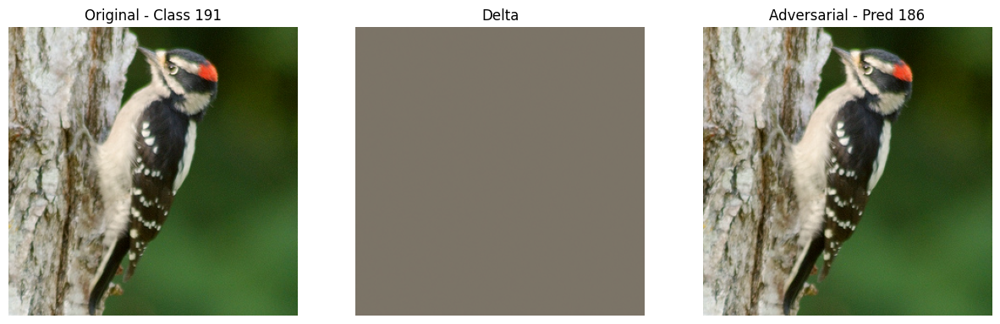

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


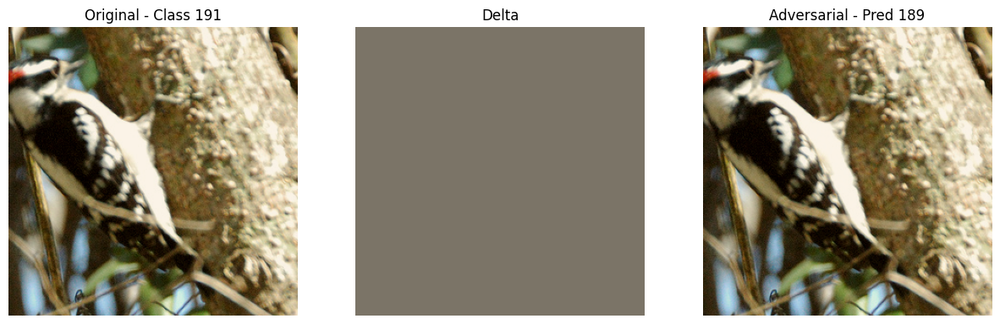

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


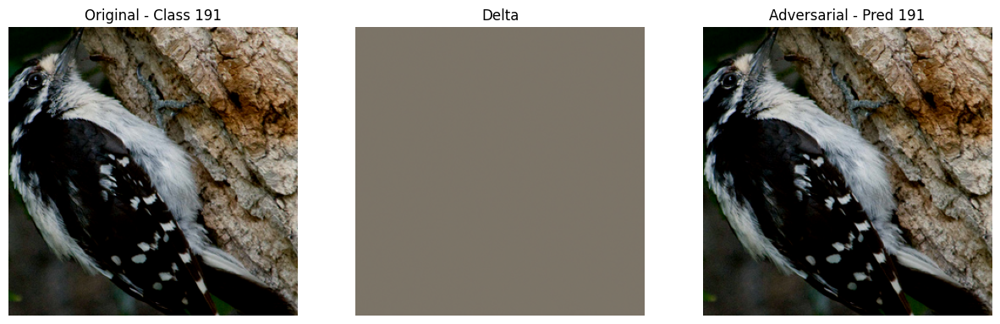

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


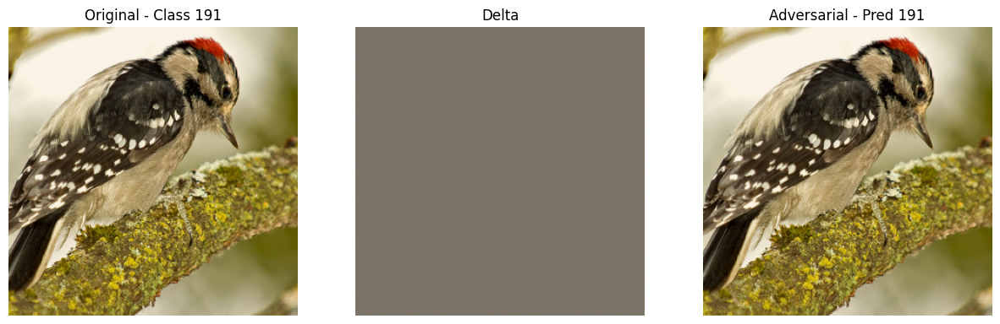

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


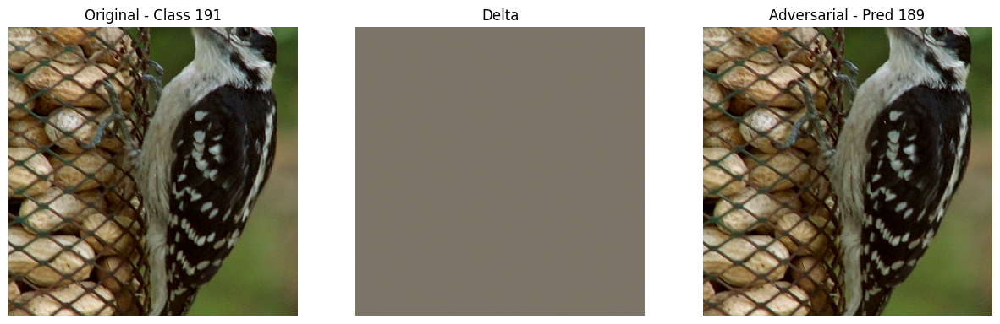

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


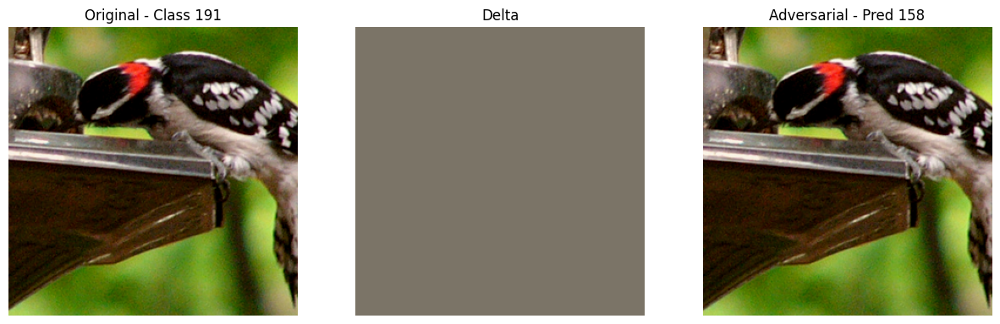

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


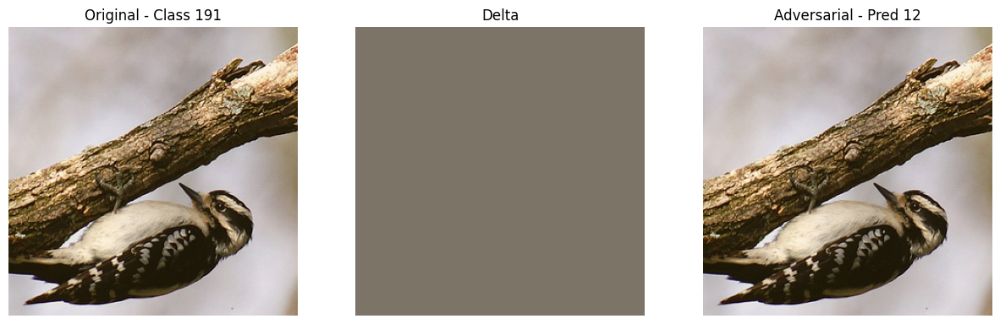

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


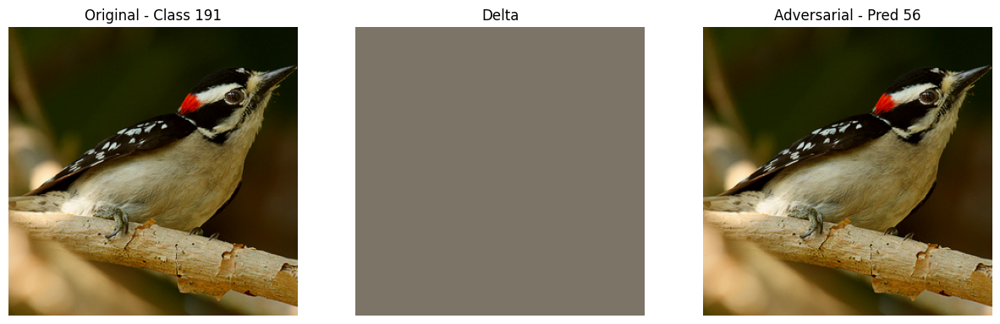

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


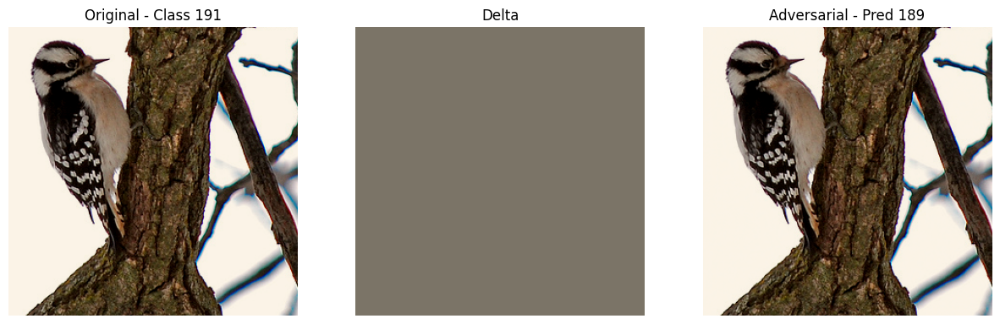

Concepts:  tensor([[0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0,
         0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0,
         1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 0, 0,
         0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0,
         1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0]], device='cuda:0')


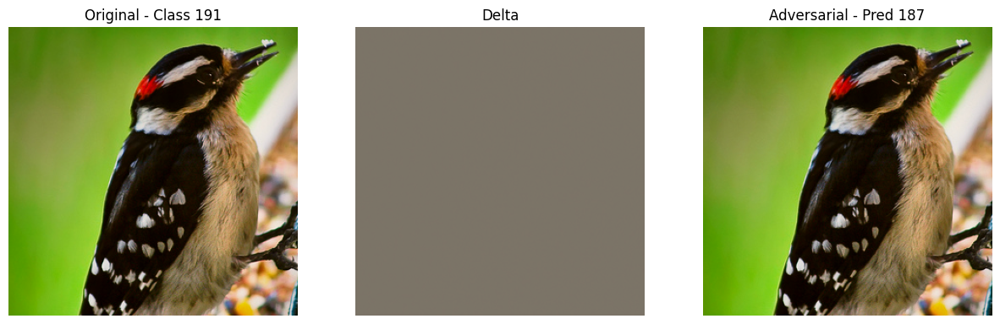

In [63]:
for i in range(10):
    attack_and_visualize(joint_model, test_loader, attack_config,  class_number=class_number, image_number=i)

Concepts:  tensor([[0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]], device='cuda:0')


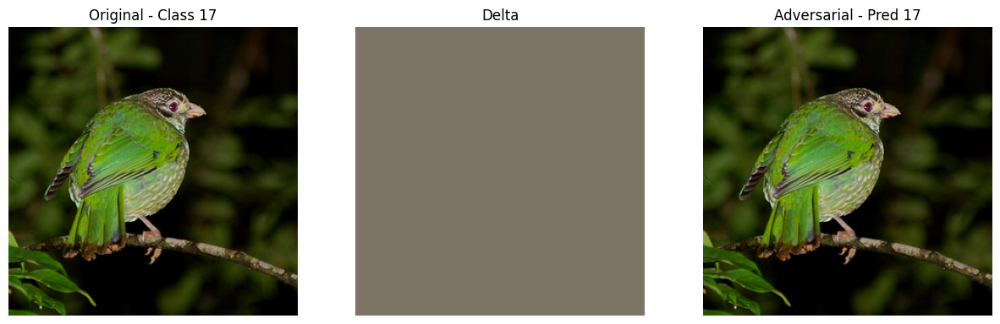

(17,
 array([0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0]))

In [83]:
attack_and_visualize(standard_model, test_loader, attack_config,  class_number=17, image_number=3)

In [11]:
new_concepts_indeces = [1, 4, 6, 7, 10, 14, 15, 20, 21, 23, 25, 29, 30, 35, 36, 38, 40, 44, 45, 50, 51, 53, 54, 56, 57, 59, 63, 64, 69, 70, 72, 75, 80, 84, 90, 91, 
    93, 99, 101, 106, 110, 111, 116, 117, 119, 125, 126, 131, 132, 134, 145, 149, 151, 152, 153, 157, 158, 163, 164, 168, 172, 178, 179, 181, 
    183, 187, 188, 193, 194, 196, 198, 202, 203, 208, 209, 211, 212, 213, 218, 220, 221, 225, 235, 236, 238, 239, 240, 242, 243, 244, 249, 253, 
    254, 259, 260, 262, 268, 274, 277, 283, 289, 292, 293, 294, 298, 299, 304, 305, 308, 309, 310, 311] # Taken from the geneate_new_data.py file


# Investigating the distribution of the concepts in the class 21

In [12]:
from collections import defaultdict 

class_number = 21

concepts_count = defaultdict(int)
for _, _, concepts in train_loader:
    concepts = torch.stack(concepts).squeeze().t().to(device)
    for concepts_row in concepts:
        for concept_idx, concept_value in enumerate(concepts_row):
            concepts_count[concept_idx] += concept_value.item()

concepts_count


defaultdict(int,
            {0: 404,
             1: 285,
             2: 1933,
             3: 1159,
             4: 1169,
             5: 1069,
             6: 302,
             7: 1978,
             8: 977,
             9: 614,
             10: 1098,
             11: 1251,
             12: 394,
             13: 1965,
             14: 840,
             15: 590,
             16: 281,
             17: 489,
             18: 681,
             19: 728,
             20: 2040,
             21: 684,
             22: 3090,
             23: 347,
             24: 376,
             25: 1079,
             26: 1196,
             27: 251,
             28: 1303,
             29: 576,
             30: 517,
             31: 1362,
             32: 803,
             33: 843,
             34: 1474,
             35: 578,
             36: 395,
             37: 239,
             38: 1039,
             39: 308,
             40: 437,
             41: 706,
             42: 780,
             43: 1766,
        

In [53]:
class_21_concepts_pre = [0, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
         0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0]
class_21_concepts = [i for i, value in enumerate(class_21_concepts_pre) if value != 0]
class_21_concepts

[3, 4, 10, 16, 25, 32, 39, 50, 52, 54, 59, 64, 70, 76, 78, 90, 97, 103, 109]

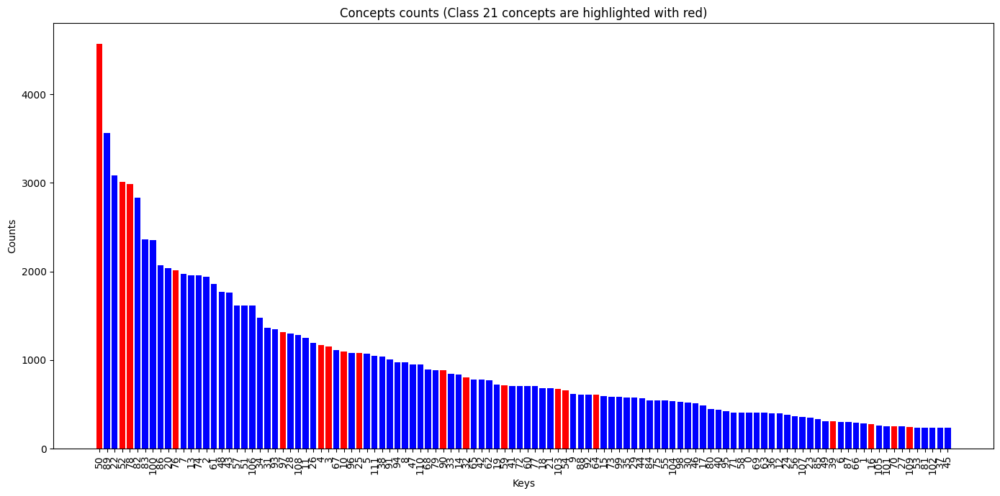

In [54]:
import matplotlib.pyplot as plt

# Example dictionary
counts_dict = concepts_count

# Sort the dictionary by values in descending order
sorted_dict = dict(sorted(counts_dict.items(), key=lambda item: item[1], reverse=True))
# List of special keys that should be colored differently
special_keys = class_21_concepts

# Separate the keys and values, and assign colors
keys = list(sorted_dict.keys())
values = list(sorted_dict.values())
colors = ['red' if key in special_keys else 'blue' for key in keys]

plt.figure(figsize=(14, 7))  # Customize the size as per your requirement

# Create a bar plot
plt.bar(range(len(sorted_dict)), values, color=colors)

# Add titles and labels as needed
plt.title('Concepts counts (Class 21 concepts are highlighted with red)')
plt.xlabel('Keys')
plt.ylabel('Counts')
plt.xticks(range(len(sorted_dict)), keys, rotation='vertical')  # Rotate the x-axis labels for better readability

# Show the plot
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()


In [56]:
for concept in class_21_concepts:
    print(concepts_count[concept], concept)

1157 3
1167 4
1093 10
279 16
1076 25
803 32
306 39
4573 50
3015 52
655 54
717 59
607 64
253 70
2016 76
2990 78
888 90
1312 97
677 103
241 109


In [57]:
new_concepts_indeces[3]

7

# Checking class 104 where the sequential model has 0 accuracy and the joint model has 84.21 and standard has 78.94

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')
tensor([ -5.7605,  -9.4108,  -4.5183,  -2.1683,   2.4521,  -6.3404,  -8.4094,
         -2.5741,  -5.6682,  -3.2978,  -0.6272,  -6.2413,  -9.4440,  -3.8090,
         -4.8105,  -2.4778,   0.4975,  -6.8511,  -7.1655,  -4.9535,  -3.5726,
          0.2699,  -4.7047,  -2.4847,  -7.2681,  -4.2897,  -6.4504,  -9.1282,
         -3.4688,  -5.1874,  -3.9841,  -4.7466,  -3.0374,  -7.3323,  -0.9127,
         -7.1409,  -2.2571,  -7.6982,  -5.4942,   0.0612,  -6.2856,  -7.0071,
         -6.1959,  -3.7935,  -7.2918,  -9.0269,  -7.4635,  -7.0073,  -1.2617,
        -10.5319,   1.1925,  -3.9660,   1.8

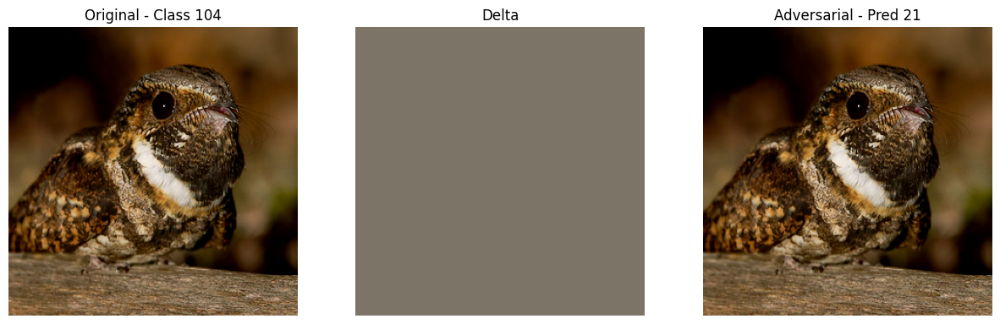

['has_wing_color::brown',
 'has_underparts_color::buff',
 'has_upper_tail_color::black',
 'has_eye_color::black',
 'has_bill_length::shorter_than_head',
 'has_nape_color::brown',
 'has_nape_color::grey',
 'has_belly_color::brown',
 'has_belly_color::buff',
 'has_wing_shape::rounded-wings',
 'has_size::small_(5_-_9_in)',
 'has_primary_color::brown',
 'has_bill_color::black',
 'has_wing_pattern::spotted']

In [62]:
# Define attack configuration
attack_config = {
    'eps': 0.001,
    'max_iter': 50,
    'nb_classes': 200
}
class_number = 104
image_number = 1

prediction, concepts = attack_and_visualize(sequential_model, test_loader, attack_config, class_number=class_number, image_number=image_number)
analyze_concepts(concepts)

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


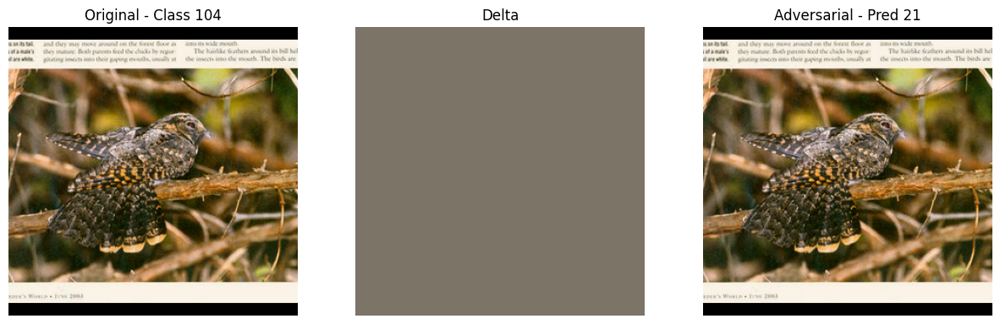

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


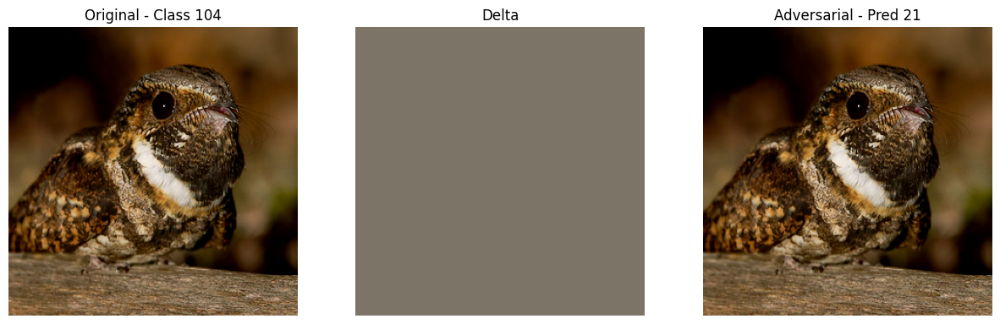

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


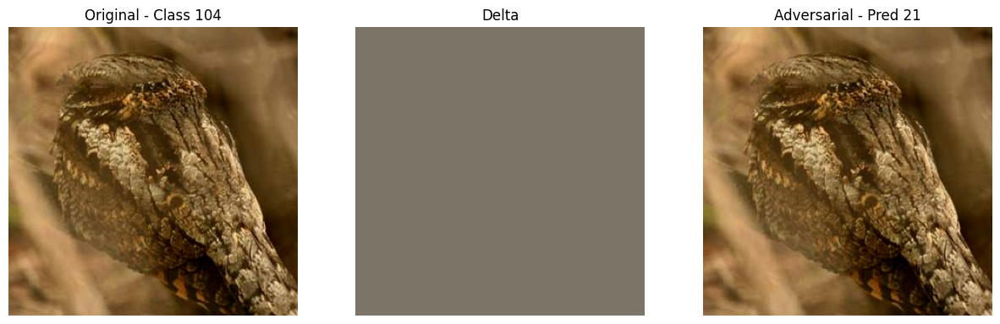

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


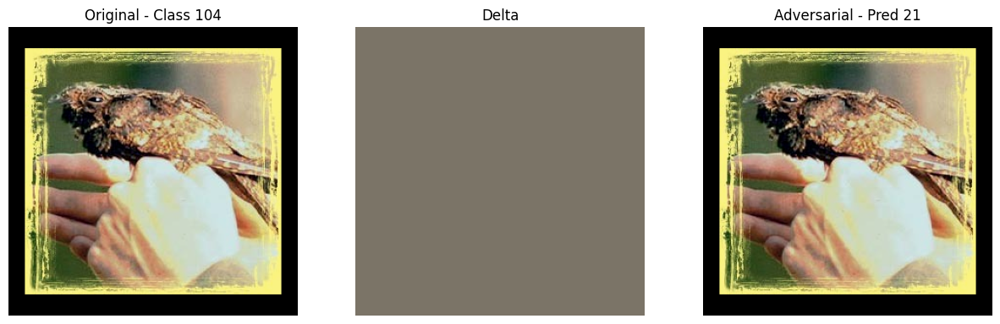

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


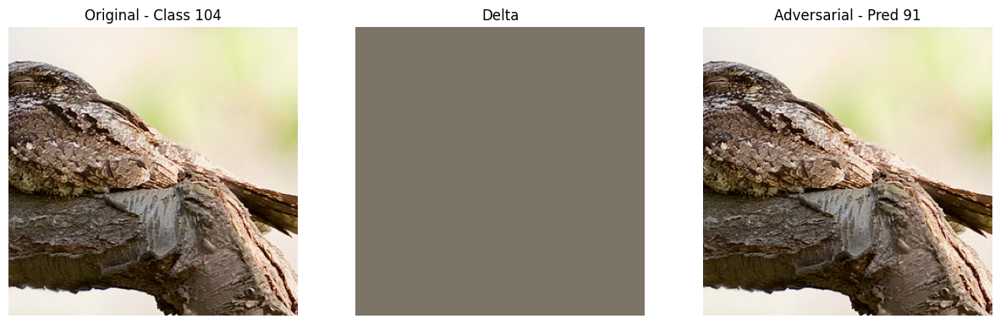

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


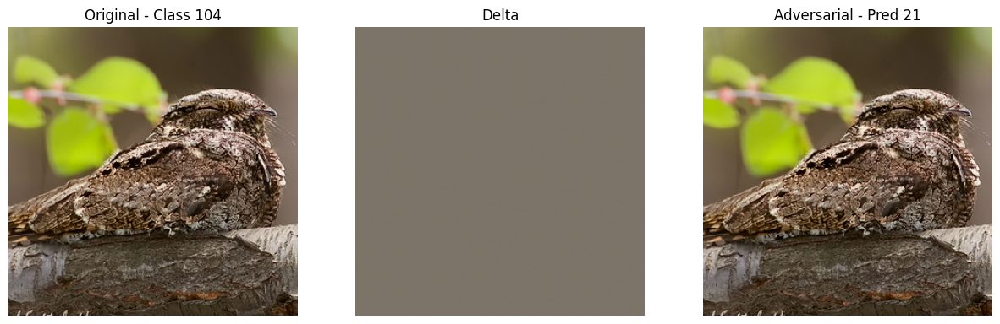

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


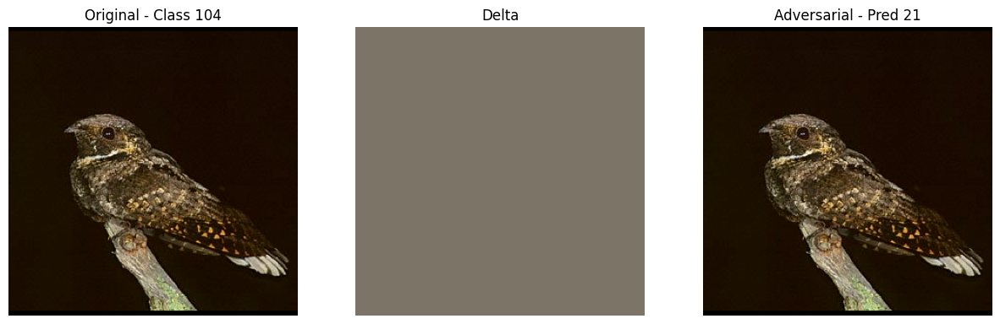

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


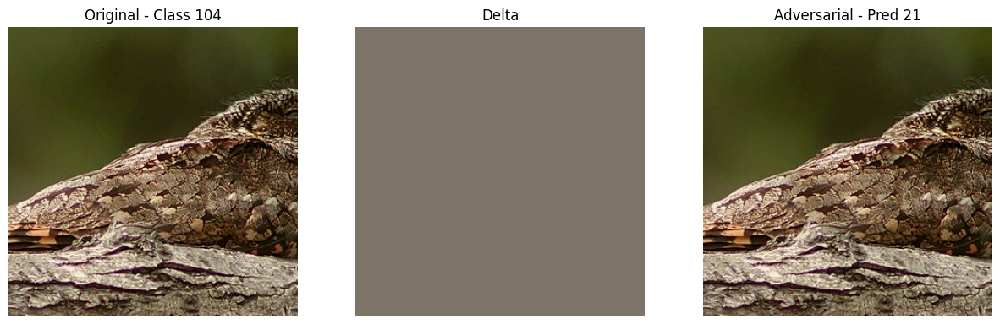

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


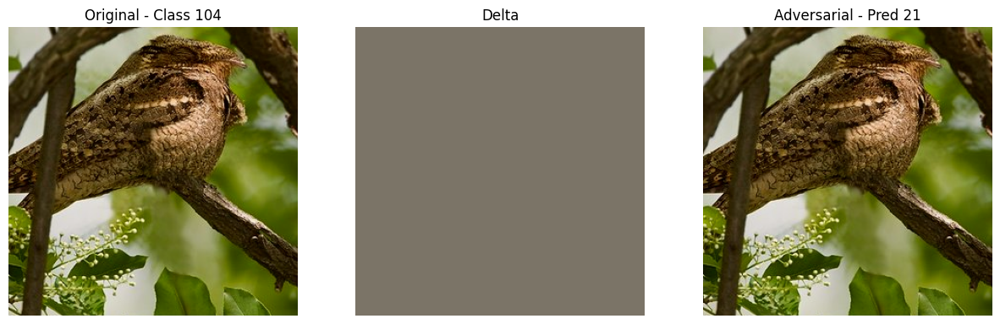

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


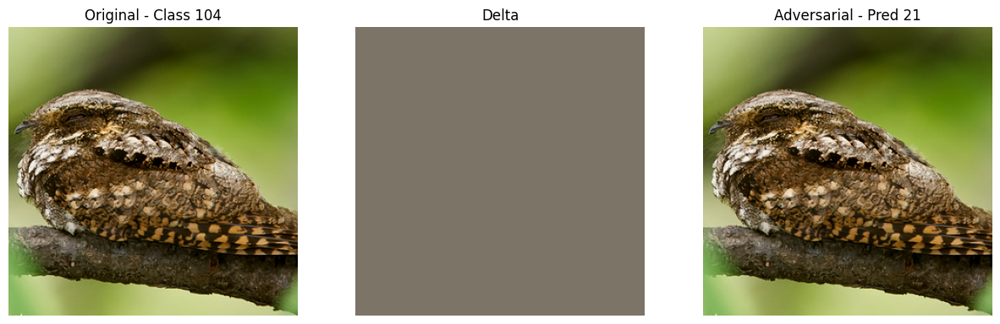

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


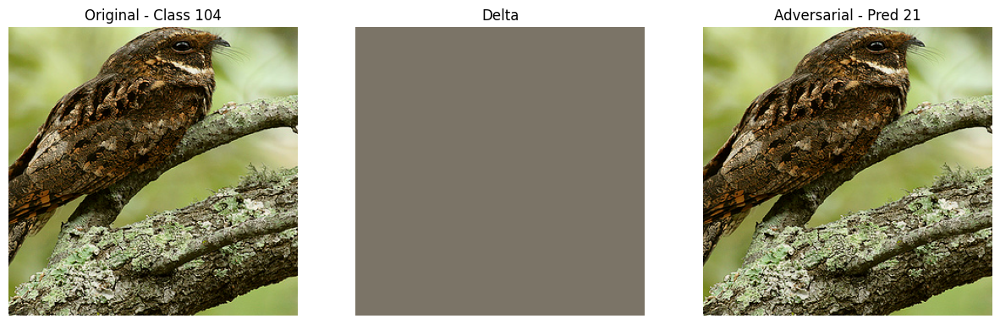

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


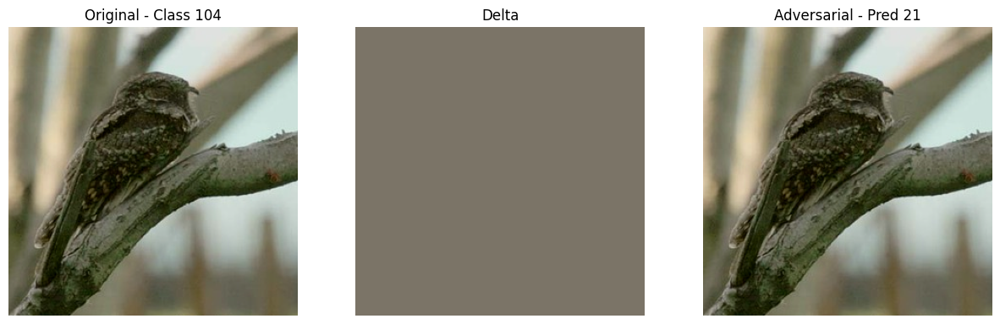

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


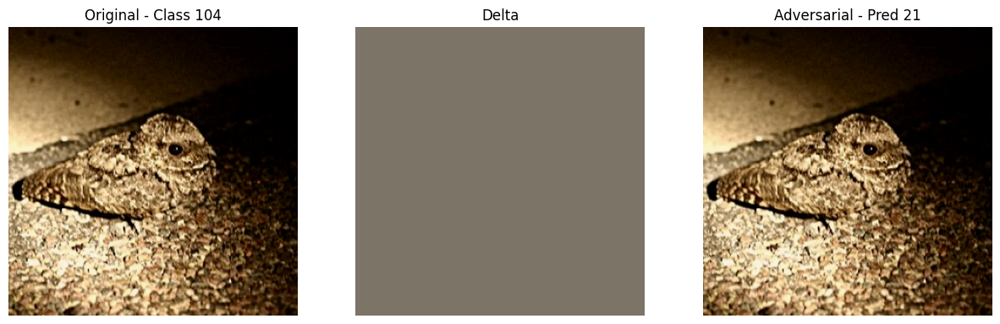

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


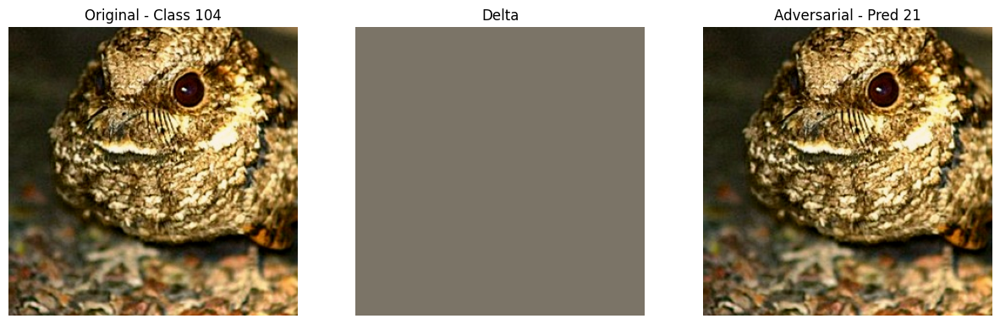

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


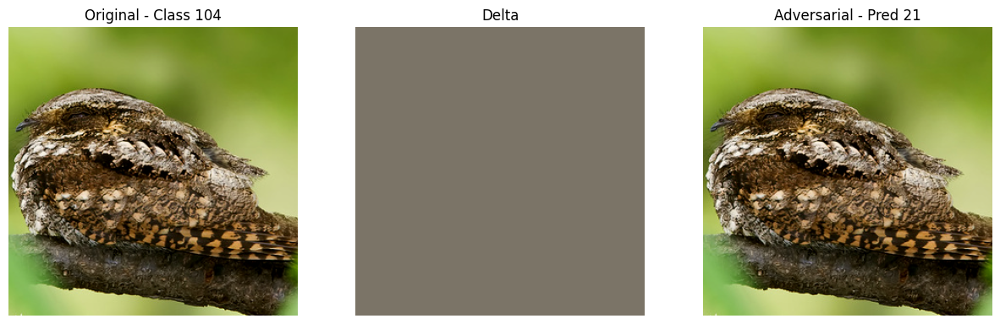

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


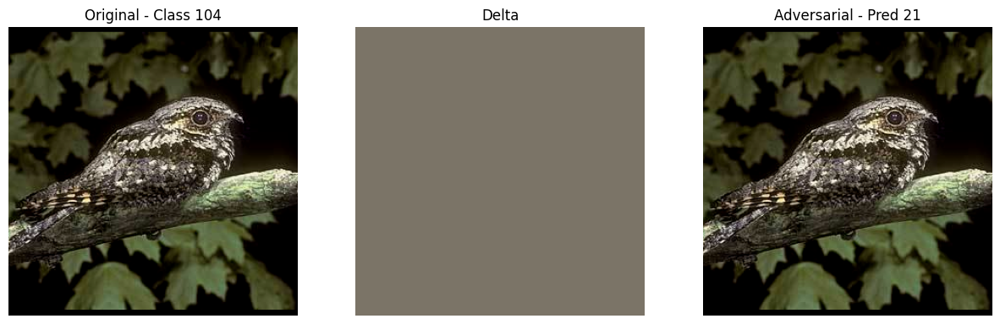

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


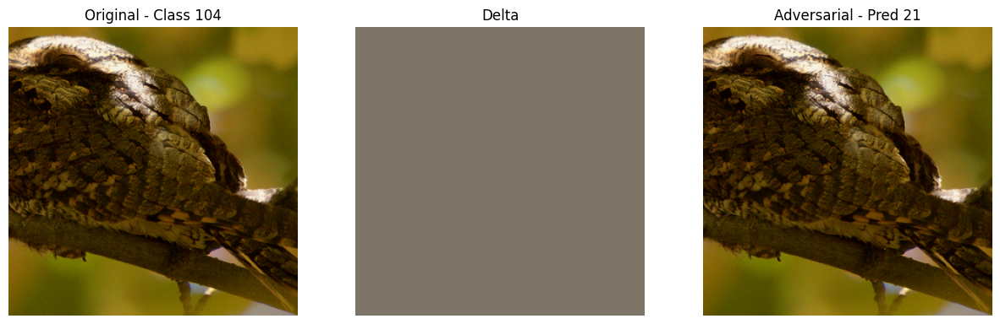

UnboundLocalError: local variable 'concept' referenced before assignment

In [86]:
for i in range(20):
    attack_and_visualize(joint_model, test_loader, attack_config,  class_number=class_number, image_number=i)

Concepts:  tensor([[0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]], device='cuda:0')


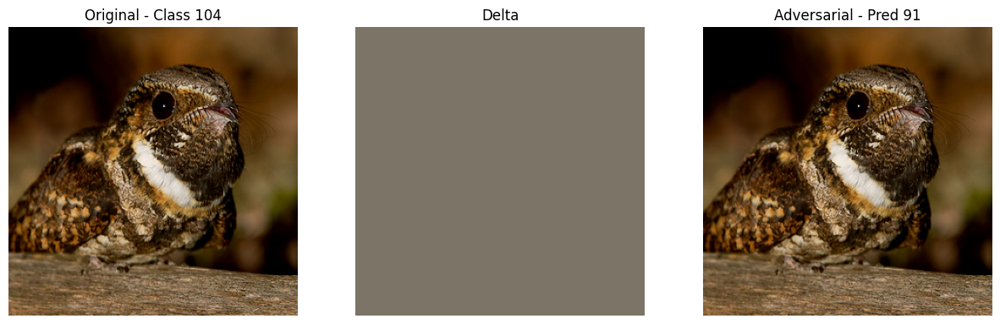

(91,
 array([0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
        0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1,
        0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
        0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1,
        0, 0]))

In [64]:
attack_and_visualize(standard_model, test_loader, attack_config,  class_number=class_number, image_number=image_number)

In [87]:
from collections import defaultdict 

class_number = 104

concepts_count = defaultdict(int)
for _, _, concepts in train_loader:
    concepts = torch.stack(concepts).squeeze().t().to(device)
    for concepts_row in concepts:
        for concept_idx, concept_value in enumerate(concepts_row):
            concepts_count[concept_idx] += concept_value.item()

concepts_count


defaultdict(int,
            {0: 406,
             1: 286,
             2: 1927,
             3: 1161,
             4: 1169,
             5: 1069,
             6: 303,
             7: 1977,
             8: 976,
             9: 614,
             10: 1098,
             11: 1249,
             12: 396,
             13: 1965,
             14: 839,
             15: 590,
             16: 281,
             17: 487,
             18: 680,
             19: 730,
             20: 2041,
             21: 682,
             22: 3089,
             23: 347,
             24: 380,
             25: 1079,
             26: 1191,
             27: 251,
             28: 1305,
             29: 574,
             30: 517,
             31: 1363,
             32: 802,
             33: 846,
             34: 1475,
             35: 577,
             36: 397,
             37: 238,
             38: 1040,
             39: 308,
             40: 436,
             41: 704,
             42: 783,
             43: 1766,
        

In [88]:
class_104_concepts_pre = [0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0,
         0, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0]
class_104_concepts = [i for i, value in enumerate(class_104_concepts_pre) if value != 0]
class_104_concepts

[4, 21, 34, 50, 52, 64, 65, 70, 75, 76, 78, 90, 100, 109]

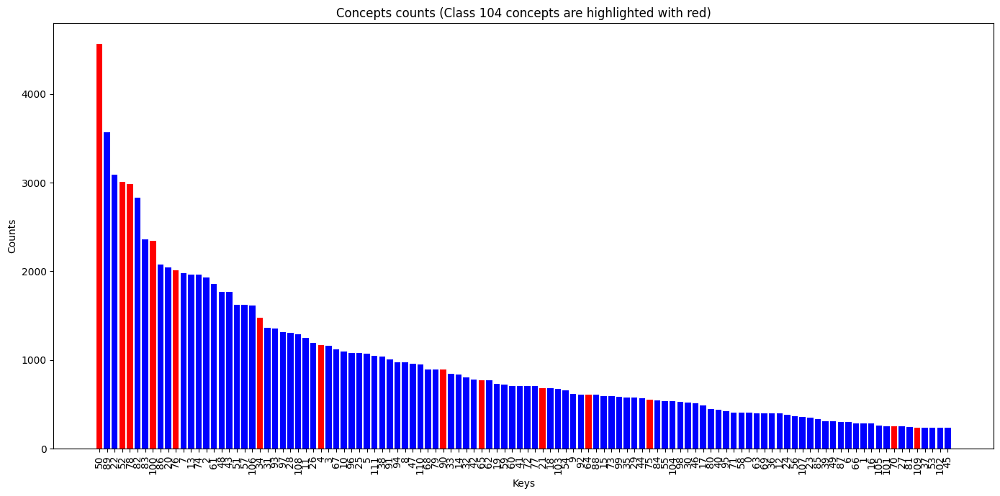

In [90]:
import matplotlib.pyplot as plt

# Example dictionary
counts_dict = concepts_count

# Sort the dictionary by values in descending order
sorted_dict = dict(sorted(counts_dict.items(), key=lambda item: item[1], reverse=True))
# List of special keys that should be colored differently
special_keys = class_104_concepts

# Separate the keys and values, and assign colors
keys = list(sorted_dict.keys())
values = list(sorted_dict.values())
colors = ['red' if key in special_keys else 'blue' for key in keys]

plt.figure(figsize=(14, 7))  # Customize the size as per your requirement

# Create a bar plot
plt.bar(range(len(sorted_dict)), values, color=colors)

# Add titles and labels as needed
plt.title('Concepts counts (Class 104 concepts are highlighted with red)')
plt.xlabel('Keys')
plt.ylabel('Counts')
plt.xticks(range(len(sorted_dict)), keys, rotation='vertical')  # Rotate the x-axis labels for better readability

# Show the plot
plt.tight_layout()  # Adjust layout to make room for the rotated x-axis labels
plt.show()


In [93]:
for i in class_104_concepts:
    print(concept_idx_to_name(i))

has_wing_color::brown
has_underparts_color::buff
has_upper_tail_color::black
has_eye_color::black
has_bill_length::shorter_than_head
has_nape_color::brown
has_nape_color::grey
has_belly_color::brown
has_belly_color::buff
has_wing_shape::rounded-wings
has_size::small_(5_-_9_in)
has_primary_color::brown
has_bill_color::black
has_wing_pattern::spotted


Attacking Images with sequential model:   0%|          | 0/182 [00:00<?, ?it/s]

Attacking Images with sequential model: 100%|██████████| 182/182 [23:42<00:00,  7.82s/it]


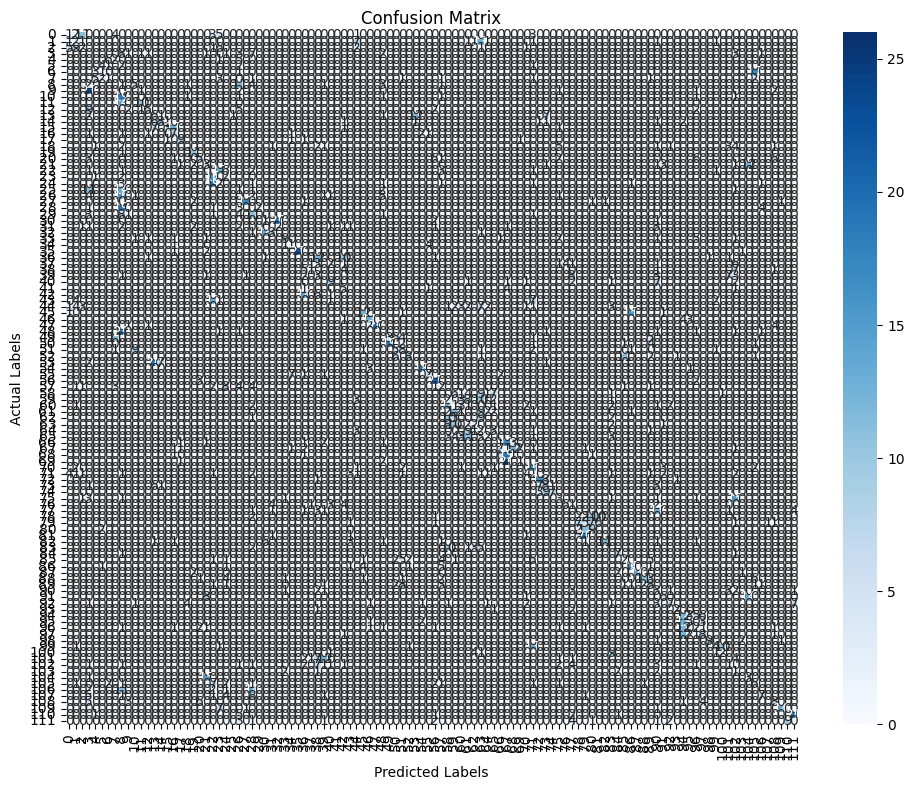

Overall accuracy: 17.21%


In [12]:
import torch
import foolbox as fb
from tqdm import tqdm
import logging
from collections import defaultdict
import numpy as np
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def deepfool_attack_and_confusion_matrix(model, test_loader, eps, model_name, num_classes):
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    model.to(device)
    fmodel = fb.PyTorchModel(model, bounds=(-0.25, 0.25))
    attack = fb.attacks.LinfDeepFoolAttack()

    all_preds = []
    all_labels = []

    for images, labels, _ in tqdm(test_loader, desc=f"Attacking Images with {model_name}"):
        images, labels = images.to(device), labels.to(device)
        _, clipped_advs, _ = attack(fmodel, images, labels, epsilons=eps)
        logits = model(clipped_advs)
        preds = torch.argmax(logits, dim=1)

        # Store for confusion matrix
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

    # Compute confusion matrix
    cm = confusion_matrix(all_labels, all_preds, labels=range(num_classes))

    # Plotting confusion matrix
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=range(num_classes), yticklabels=range(num_classes))
    plt.title('Confusion Matrix')
    plt.ylabel('Actual Labels')
    plt.xlabel('Predicted Labels')
    plt.tight_layout()
    plt.show()

    # Calculate overall accuracy
    accuracy = np.sum(np.diag(cm)) / np.sum(cm)
    print(f"Overall accuracy: {accuracy*100:.2f}%")
    
    return cm, accuracy

# Example usage, assuming `model`, `test_loader`, `eps`, and `model_name` are defined, and `num_classes` is known
cm, accuracy = deepfool_attack_and_confusion_matrix(sequential_model, test_loader, 0.001, 'sequential model', 112)


In [13]:
import logging
import foolbox as fb
from collections import defaultdict
from tqdm import tqdm

# Set up logging
logging.basicConfig(filename='logs.txt', level=logging.INFO, 
                    format='%(asctime)s:%(levelname)s:%(message)s')

def deepfool_attack(model, test_loader, eps, model_name):
    bounds = (-0.25, 0.25)
    fmodel = fb.PyTorchModel(model, bounds=bounds)
    attack = fb.attacks.LinfDeepFoolAttack()

    # Track the number of correct predictions overall and per class
    correct_per_class = defaultdict(int)
    total_per_class = defaultdict(int)
    counter = 0
    all_labels = []
    all_predictions = []
    for images, labels, _ in tqdm(test_loader, desc=f"Attacking Images with {model_name}"):
        images, labels = images.to(device), labels.to(device)
        raw_advs, clipped_advs, success = attack(fmodel, images, labels, epsilons=eps)
        logits = model(clipped_advs)
        preds = torch.argmax(logits, dim=1)

        # Update per class correct predictions
        for label, pred in zip(labels, preds):
            total_per_class[label.item()] += 1
            if label == pred:
                correct_per_class[label.item()] += 1
            all_labels.append(label)
            all_predictions.append(pred)

        # counter += 1
        # if counter == 10:
        #     break

    # Calculate per-class accuracy
    per_class_accuracy = {cls: correct_per_class[cls] / total_per_class[cls] for cls in total_per_class}

    # Log the per-class accuracy
    logging.info(f"Model: {model_name}, Eps: {eps}, Per-class accuracy: {per_class_accuracy}")

    # Calculate and log the final accuracy for the adversarial images
    final_accuracy = sum(correct_per_class.values()) / sum(total_per_class.values())
    logging.info(f"Model: {model_name}, Eps: {eps}, Accuracy on adversarial examples: {final_accuracy*100:.2f}%")
    return final_accuracy, per_class_accuracy, all_labels, all_predictions

models = ['Sequential', 'joint_model', 'standard_model']
models_classes = {'Sequential': Sequential, 'joint_model': Joint, 'standard_model': Standard}
save_models_path = r"src/Adversarially trained models"
csv_file_path = r"src/Adversarially trained models/experiments.csv"
attack_config = {
    'eps_step': 0.01,
    'max_iter': 10,
    'clip_values': (-0.25, 0.25),
    'input_shape': (3, 299, 299),
    'nb_classes': 200
}
# # Example usage:
# attack_mapping = {
#     'CWL2': CarliniL2Method,
#     'CWLinf': CarliniLInfMethod,
#     'DeepFool': DeepFool
# }

eps_values = [0.001]
experiments = []
models_cm = {}
# Loading the models
for model_name in models:
  for eps in eps_values:
    experiment = {
        'model_name': model_name,
        'Trained on eps': eps
    }
    if model_name == 'Sequential':
        model_1_path = r'ConceptModel__Seed1 old/output/best_model_1.pth'
        model_2_path = r'SequentialModel_WithVal__Seed1/best_model_42.pth'
        model = Sequential(model_1_path, model_2_path).to(device)
        model.eval()
    elif model_name == 'joint_model':
        joint_model_path = 'Joint0.01Model__Seed1/outputs/best_model_1.pth'
        model = Joint(joint_model_path).to(device)
        model.eval()
    elif model_name == 'standard_model':
        model = Standard("Standard0Model_Seed1/outputs/best_model_1.pth").to(device)
        model.eval()
        
    model_path = f"{save_models_path}/{model_name}_{str(eps).split('.')[1]}.pth"
    model.load_state_dict(torch.load(model_path))
    print(f"Loaded {model_name}_{str(eps).split('.')[1]}")
    # selected_attack = attack_mapping['CWL2']
    model.eval()
    # accuracy = attack_deepfool(model, test_loader,test_labels, attack_config)
    accuracy, per_class_accuracy, all_labels, all_predictions = deepfool_attack(model, test_loader, eps, model_name)
    models_cm[model_name] = {'all_labels': all_labels, 'all_predictions': all_predictions}
    print(accuracy)



Loaded Sequential_001


Attacking Images with Sequential: 100%|██████████| 182/182 [22:54<00:00,  7.55s/it]


0.3709009319986193
Loaded joint_model_001


Attacking Images with joint_model: 100%|██████████| 182/182 [21:24<00:00,  7.06s/it]


0.3225750776665516
Loaded standard_model_001


Attacking Images with standard_model: 100%|██████████| 182/182 [22:21<00:00,  7.37s/it]

0.4345875043148084


In [14]:
models_cm

{'Sequential': {'all_labels': [tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(0, device='cuda:0'),
   tensor(1, device='cuda:0'),
   tensor(1

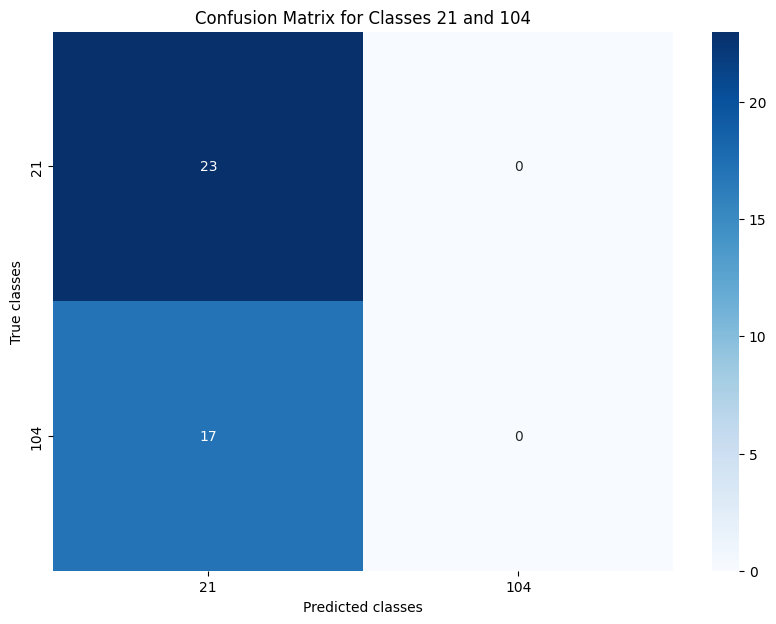

In [46]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# Assuming models_cm is a dictionary with 'all_labels' and 'all_predictions' for the 'Sequential' model
all_labels = models_cm['Sequential']['all_labels']
all_predictions = models_cm['Sequential']['all_predictions']

# Define target classes
target_classes = [21, 104]

# Initialize confusion matrix
conf_matrix = np.zeros((len(target_classes), len(target_classes)))

# Populate confusion matrix
for true_label, predicted_label in zip(all_labels, all_predictions):
    if true_label in target_classes and predicted_label in target_classes:
        i = target_classes.index(true_label)
        j = target_classes.index(predicted_label)
        conf_matrix[i, j] += 1

# Convert to DataFrame for plotting
conf_matrix_df = pd.DataFrame(conf_matrix, index=target_classes, columns=target_classes)

# Plotting
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_df, annot=True, cmap="Blues", fmt='g')
plt.title('Confusion Matrix for Classes 21 and 104')
plt.xlabel('Predicted classes')
plt.ylabel('True classes')
plt.show()


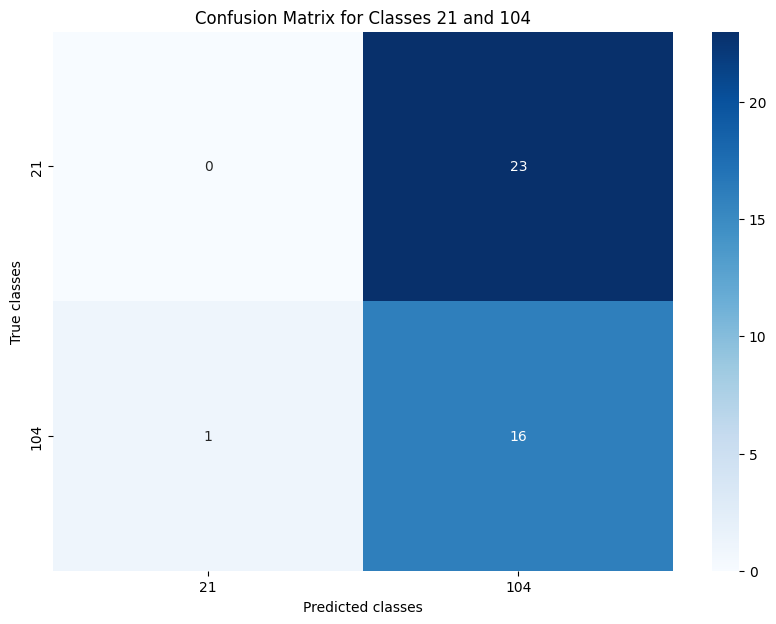

In [47]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# Assuming models_cm is a dictionary with 'all_labels' and 'all_predictions' for the 'Sequential' model
all_labels = models_cm['joint_model']['all_labels']
all_predictions = models_cm['joint_model']['all_predictions']

# Define target classes
target_classes = [21, 104]

# Initialize confusion matrix
conf_matrix = np.zeros((len(target_classes), len(target_classes)))

# Populate confusion matrix
for true_label, predicted_label in zip(all_labels, all_predictions):
    if true_label in target_classes and predicted_label in target_classes:
        i = target_classes.index(true_label)
        j = target_classes.index(predicted_label)
        conf_matrix[i, j] += 1

# Convert to DataFrame for plotting
conf_matrix_df = pd.DataFrame(conf_matrix, index=target_classes, columns=target_classes)

# Plotting
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_df, annot=True, cmap="Blues", fmt='g')
plt.title('Confusion Matrix for Classes 21 and 104')
plt.xlabel('Predicted classes')
plt.ylabel('True classes')
plt.show()


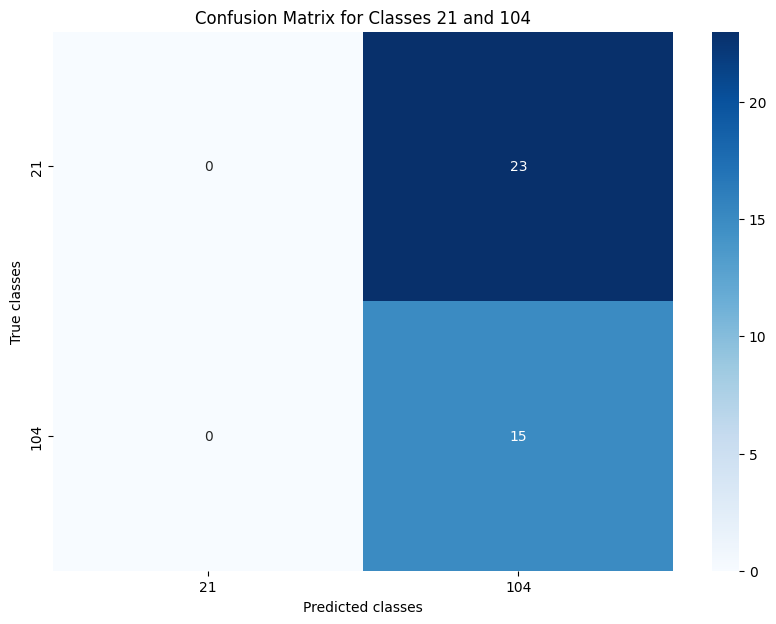

In [48]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from collections import defaultdict

# Assuming models_cm is a dictionary with 'all_labels' and 'all_predictions' for the 'Sequential' model
all_labels = models_cm['standard_model']['all_labels']
all_predictions = models_cm['standard_model']['all_predictions']

# Define target classes
target_classes = [21, 104]

# Initialize confusion matrix
conf_matrix = np.zeros((len(target_classes), len(target_classes)))

# Populate confusion matrix
for true_label, predicted_label in zip(all_labels, all_predictions):
    if true_label in target_classes and predicted_label in target_classes:
        i = target_classes.index(true_label)
        j = target_classes.index(predicted_label)
        conf_matrix[i, j] += 1

# Convert to DataFrame for plotting
conf_matrix_df = pd.DataFrame(conf_matrix, index=target_classes, columns=target_classes)

# Plotting
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_df, annot=True, cmap="Blues", fmt='g')
plt.title('Confusion Matrix for Classes 21 and 104')
plt.xlabel('Predicted classes')
plt.ylabel('True classes')
plt.show()


In [38]:
import pandas as pd
target_class = 21

classification = defaultdict(int)
for i, label in enumerate(models_cm['Sequential']['all_labels']):
    if label == target_class:
        classification[models_cm['Sequential']['all_predictions'][i].item()] += 1

print(classification)
# Convert your classification result into confusion matrix format
all_classes = sorted(classification.keys() | {target_class})
confusion_matrix = np.zeros((len(all_classes), len(all_classes)))

for idx, predicted_class in enumerate(all_classes):
    if predicted_class == target_class:
        confusion_matrix[all_classes.index(target_class), idx] = classification.get(predicted_class, 0)
    else:
        confusion_matrix[all_classes.index(target_class), idx] = classification.get(predicted_class, 0)

# Convert to DataFrame for labeling in Seaborn
conf_matrix_df = pd.DataFrame(confusion_matrix, index=all_classes, columns=all_classes)

# Plotting
plt.figure(figsize=(10, 7))
sns.heatmap(conf_matrix_df, annot=True, cmap='Blues', fmt='g')
plt.title('Confusion Matrix for Target Class {}'.format(target_class))
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()


defaultdict(<class 'int'>, {21: 23, 3: 1, 183: 1, 91: 1})


IndexError: index 1 is out of bounds for axis 0 with size 1

defaultdict(<class 'int'>, {21: 17, 66: 1, 91: 1})


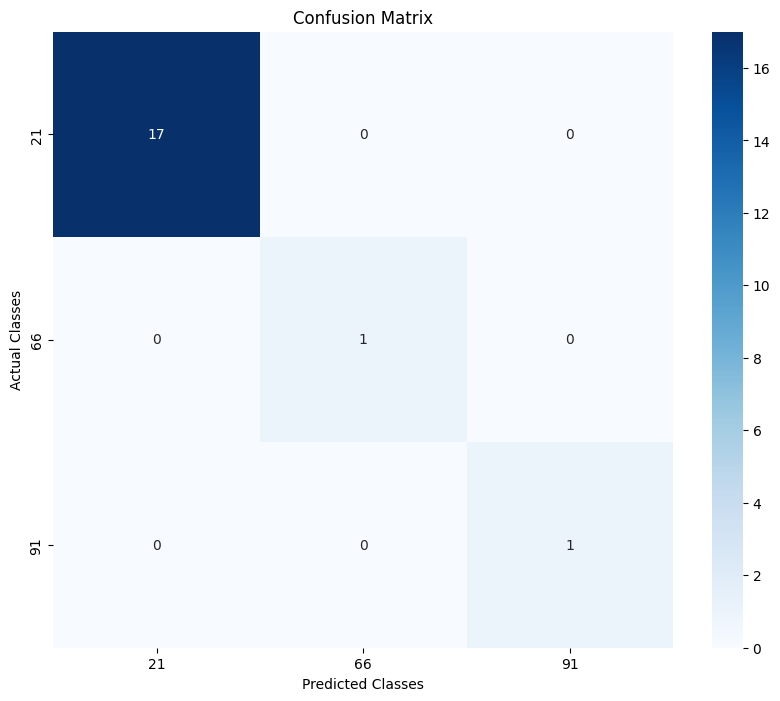

In [33]:
target_class = 104

classification = defaultdict(int)
for i, label in enumerate(models_cm['Sequential']['all_labels']):
    if label == target_class:
        classification[models_cm['Sequential']['all_predictions'][i].item()] += 1

print(classification)
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import confusion_matrix

# Provided dictionary
data_dict = classification
# Extract unique classes and sort them
unique_classes = sorted(data_dict.keys())

# Create a mapping from class to index
class_to_idx = {cls: idx for idx, cls in enumerate(unique_classes)}

# Create a list of predictions and true labels based on the dictionary
# Assuming the prediction is correct as per the dictionary key-value
y_true = []
y_pred = []
for true_class, count in data_dict.items():
    y_true += [true_class] * count
    y_pred += [true_class] * count

# Convert class labels to indices
y_true_idx = [class_to_idx[cls] for cls in y_true]
y_pred_idx = [class_to_idx[cls] for cls in y_pred]

# Compute confusion matrix
conf_mat = confusion_matrix(y_true_idx, y_pred_idx, labels=range(len(unique_classes)))

# Plotting the confusion matrix
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', ax=ax,
            xticklabels=unique_classes, yticklabels=unique_classes)
plt.title('Confusion Matrix')
plt.ylabel('Actual Classes')
plt.xlabel('Predicted Classes')
plt.show()

In [27]:
target_class = 21
model_inv = 'joint_model'

classification = defaultdict(int)
for i, label in enumerate(models_cm[model_inv]['all_labels']):
    if label == target_class:
        classification[models_cm[model_inv]['all_predictions'][i].item()] += 1

classification

defaultdict(int, {104: 23, 32: 1, 27: 1, 189: 1})

In [28]:
target_class = 21
model_inv = 'standard_model'

classification = defaultdict(int)
for i, label in enumerate(models_cm[model_inv]['all_labels']):
    if label == target_class:
        classification[models_cm[model_inv]['all_predictions'][i].item()] += 1

classification

defaultdict(int, {104: 23, 91: 3})